# 1 Author

**Student Name:** Nivedhaa Ravichandren

**Student ID:** 220256573

# 2 Problem formulation

To predict whether the audio segment has been recorded indoors or outdoors.

# 3 Machine Learning pipeline

We have created a dataset with sounds recoreded from specific locations both indoors and outdoors across London. The objective is to predict whether the sound was recorded indoors or outdoors. From the total recordings, a set of randomly selected 500 samples are taken as the input. 

**INPUT**: Randomly selected 500 samples from audio recorded across London


**OUTPUT**: Prediction whether the sound was recorded indoors or outdoors

We then extract the needed features from the audio files. Features like Pitch, frequency etc. are used to identify the nature of the recording. This is done using the librosa package. An array containing all these features is created and used to create X and Y which serve as the input for the model to learn. 



# 4 Transformation stage

**Attributes:**
1. File id (Audio file)
2. Area (Place where audio was recorded)
3. Spot (Exact spot of recording)
4. Indoor / Outdoor (Whether the sound was recorded indoor or outdoor)
5. Participant (Unique ID)

This is the basic csv file provided for analysis. We further extract audio files from the the above attributes to help the model predict more precisely. This is because the raw audio files have multiple dimensions which can be very challenging while predicting. 
The ***audio features*** extracted are:

1. **Power** : Intensity of sound. To identify the section of the signal that are significantly louder or quieter.
2. **Pitch - Mean** : Mean of frequency of the sound waves.
3. **Pitch - Standard Deviation** : Standard Deviation of frequency of sound waves.
4. **Fraction of voiced region** : Proportion of signal that contains periodic patterns as opposed to random patterns.
5. **MFCC** : (Mel-frequency cepstral coefficients). represents spectral characteristics of the sound.

**Feature Extraction:**
These are used as the predictors. Additional feature that is extracted is MFCC. MFCC is usually robust to the overall spectrum of the audio signal where the voice of speaker and recording conditions can vary widely. Since our audio signals contain similar characteristics, it will be beneficial to use this feature to identify whether the sound is recorded indoor or outdoors.

**Scaling:**

Scaling is bringing the features of the dataset to as single scale by removing the mean and scaling to unit variance. This is done because most of the machine learning models assume that the features are in the same scale and is normally distrbuted. To make the model work more efficiently, we need to scale down the features to the same scale before working on them.

# 5 Modelling

The problem statement depicts a binary class Classification problem. 

The first model used is SVM (Support Vector Machine).

**Why SVM?**

SVM can easily handle high-dimensional data which is essential for our dataset. In this model, the distance between the nearest points of each class and the hyperplane is maximized which prevents overfitting in case of new data. They alse work well with large  number of features.

The second model used is Random Forest.

**Why Random Forest?**

In general, Ensemble models perform better than individual models. Most commonly used Ensemble model is Random Forest which is built based on decision trees as individual models. They can also handle high dimensional data efficiently while taking up less computation time. They are relatively resisatnt to overfitting also.

**Why XGBoost?**

XGBoost is better suited for large scale datasets and real time applications. It is flexible for to different types of data and is good at identifying the most important features for making predictions.

Based on the performance of each of the model after using hyperparameter tuning and other optimization techniques, we select one model that performs well on all aspects.


# 6 Methodology

Since the data is almost balanced, ***accuracy*** can be taken as a measure for evaluating the model. There are other measures of accuracy used here : ***Precision, Recall, F1-Score***.

Accuracy can be used here since the goal is to make the right prediction and the target classes are almost balanced (indoor - 247, outdoor - 253). 

Apart from accuracy, we use Precision, Recall and F1-Score also as measures of evaluation. They can be used to measure how many samples that have been classified under a specific class actually belong to that specific class.

**Precision:** How often the model correctly predicts the target class. Used when False Positives are expensive. Eg. Medical Diagnosis, Fraud Detection

**Recall:** How well the model captures all the instances of the target class. Eg. Disease detection

**F1 Score:** Harmonic mean of precision and recall. Value ranges from 0 to 1 where 1 indicates better performance.

**Confusion Matrix:** 

Confusion Matrix is used to understand how the model has performed overall and is most useful for classification tasks. Rows represent the actual classes of the data and the columns represent the predicted classes. Evaluation metrics like Precision, Recall and F1-Score can be calculated directly using this matrix.

**Classification Report:**

Classification report is useful to compare the performance of the model on different classes and includes the metrics Precision, Recall and F1 Score for each of the target variable.


# 7 Dataset

A small subset of MLEnd London Sounds Dataset - Audio recordings from sounds recorded across London.

**Attributes:**
1. File id (Audio file)
2. Area (Place where audio was recorded)
3. Spot (Exact spot of recording)
4. Indoor / Outdoor (Whether the sound was recorded indoor or outdoor)
5. Participant (Unique ID)


In [ ]:
#Importing Libraries

from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = '/content/drive/MyDrive/Data/MLEndLS'
os.listdir(path)

['MLEndLS_2.zip', 'MLEndLS_Sample.zip', 'sample', 'sample_2']

In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample_2/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_2.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)



In [ ]:
sample_path = '/content/drive/MyDrive/Data/MLEndLS/sample_2/*.wav'
files = glob.glob(sample_path)
len(files)

500

In [ ]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

In [ ]:
# Exploring the dataframe

MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


In [ ]:
MLENDLS_df['area'].value_counts()

campus        823
westend       666
british       404
Euston        234
southbank     229
kensington    144
Name: area, dtype: int64

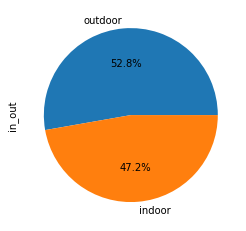

In [ ]:
# Distribution of target variable

MLENDLS_df['in_out'].value_counts().plot(kind = 'pie', autopct='%1.1f%%')
plt.show()

We can see that the data is almost balanced.

In [ ]:
for file in files:
  print(file.split('/')[-1])

0670.wav
0671.wav
0672.wav
0673.wav
0674.wav
0675.wav
0676.wav
0678.wav
0677.wav
0680.wav
0679.wav
0681.wav
0682.wav
0683.wav
0684.wav
0686.wav
0685.wav
0687.wav
0689.wav
0688.wav
0690.wav
0691.wav
0692.wav
0694.wav
0693.wav
0695.wav
0696.wav
0697.wav
0699.wav
0698.wav
0700.wav
0701.wav
0702.wav
0704.wav
0705.wav
0703.wav
0707.wav
0706.wav
0708.wav
0709.wav
0710.wav
0711.wav
0712.wav
0713.wav
0714.wav
0715.wav
0716.wav
0717.wav
0718.wav
0719.wav
0720.wav
0722.wav
0721.wav
0723.wav
0724.wav
0725.wav
0727.wav
0728.wav
0726.wav
0729.wav
0730.wav
0731.wav
0732.wav
0733.wav
0734.wav
0735.wav
0736.wav
0737.wav
0738.wav
0739.wav
0740.wav
0741.wav
0742.wav
0743.wav
0744.wav
0746.wav
0745.wav
0747.wav
0748.wav
0749.wav
0751.wav
0750.wav
0752.wav
0753.wav
0754.wav
0755.wav
0756.wav
0758.wav
0757.wav
0759.wav
0760.wav
0761.wav
0762.wav
0763.wav
0766.wav
0764.wav
0765.wav
0767.wav
0768.wav
0769.wav
0770.wav
0771.wav
0772.wav
0773.wav
0776.wav
0774.wav
0775.wav
0778.wav
0777.wav
0779.wav
0780.wav
0

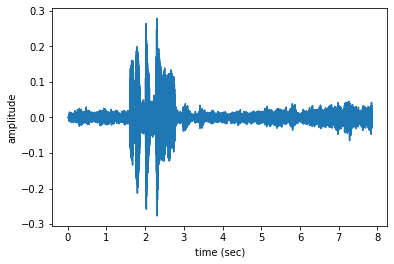

In [ ]:
n=0
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

In [ ]:
MLENDLS_df.loc[files[n].split('/')[-1]]

area            Euston
spot           ritblat
in_out          indoor
Participant        S12
Name: 0670.wav, dtype: object

In [ ]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 346626 samples


In [ ]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  #mfccs = librosa.feature.mfcc(x, sr=fs)
  return f0,voiced_flag

In [ ]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['in_out']=='indoor'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)

    mfccs = librosa.feature.mfcc(x, sr=fs)
    mfccs_mean = np.nanmean(mfccs) if np.mean(np.isnan(mfccs))<1 else 0 
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power, pitch_mean, pitch_std, voiced_fr, mfccs_mean]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [ ]:
X,y = getXy(files, labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 500/500 [13:20<00:00,  1.60s/it]


In [ ]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)

The shape of X is (500, 5)
The shape of y is (500,)
The labels vector is [ True False False False False  True  True False  True  True  True  True
  True  True False  True  True  True False  True  True  True  True False
 False  True  True False False False  True  True  True False False  True
 False False  True  True False False False  True False  True False  True
  True  True False  True  True False False False False  True False False
  True False False  True False  True  True  True  True False  True False
 False False  True False  True False  True False  True False False False
  True False  True False False  True  True  True  True  True  True False
 False  True False False  True  True  True False  True False  True False
  True False False False  True  True False False False  True  True  True
  True False False False  True False False False  True False False  True
  True False  True False False False  True False False False False  True
  True  True  True False  True False False  True  T

In [ ]:
# Distribution of indoor and outdoor recordings

print(' The number of indoor recordings is ', np.count_nonzero(y))
print(' The number of outdoor recordings is ', y.size - np.count_nonzero(y))

 The number of indoor recordings is  247
 The number of outdoor recordings is  253


# 8 Results

We build different models and train them on the training dataset and evaluate on the validation dataset.

In [ ]:
# Train test split

from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((350, 5), (150, 5), (350,), (150,))

In [ ]:
# Scaling

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_Xtrain = scaler.fit_transform(X_train)
scaled_Xval = scaler.fit_transform(X_val)
print(scaled_Xtrain)

[[-0.36751075  0.99136289  1.23212694  0.15945608 -0.12958133]
 [ 0.6390675  -0.83021242 -0.84301903 -0.22103471  1.34693413]
 [ 0.69572883  0.64696948 -0.25250753  0.43121579  0.40057585]
 ...
 [-0.80050657  0.50498452  1.16083365 -0.21420746 -0.28059176]
 [-0.77537031 -0.20889948  0.00934036 -0.40118008 -0.13451953]
 [-0.04454214  1.57666548  1.00891097 -0.12691423  0.19443658]]


In [ ]:
# SVM without scaling

model  = svm.SVC(C=1, gamma = 2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.9657142857142857
Validation  Accuracy 0.5533333333333333
The support vectors are (348, 5)


In [ ]:
# SVM after Scaling 

model  = svm.SVC(C=1,gamma=2)
model.fit(scaled_Xtrain,y_train)

yt_p = model.predict(scaled_Xtrain)
yv_p = model.predict(scaled_Xval)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.88
Validation  Accuracy 0.68
The support vectors are (316, 5)


In [ ]:
# Hyperparameter Tuning For SVM

from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
  
grid = GridSearchCV(model, param_grid, refit = True, verbose = 3)
grid.fit(scaled_Xtrain, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.729 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.529 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.500 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.586 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.557 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.643 total time=   0.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.514 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.529 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.500 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.586 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.629 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

GridSearchCV(estimator=SVC(C=1, gamma=2),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)

{'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}
SVC(C=100, gamma=0.1)


In [ ]:
c_val = grid.best_estimator_.C
gamma_val = grid.best_estimator_.gamma
c_val, gamma_val

(100, 0.1)

In [ ]:
# Building SVM model with best paraemeters

model  = svm.SVC(C=c_val, gamma = gamma_val, kernel = 'rbf')
model.fit(scaled_Xtrain,y_train)

yt_p = model.predict(scaled_Xtrain)
yv_p = model.predict(scaled_Xval)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.8114285714285714
Validation  Accuracy 0.6666666666666666
The support vectors are (229, 5)


**RANDOM FOREST CLASSIFIER**

In [ ]:
# Random Forest Classifier without hyperparameter tuning

from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=100)
rfc.fit(scaled_Xtrain,y_train)

ytrain_p = rfc.predict(scaled_Xtrain)
yval_p = rfc.predict(scaled_Xval)

print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 1.0
Validation  Accuracy 0.6466666666666666


In [ ]:
# Hyperparameter tuning for Random Forest Classifier

param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [ ]:
#Grid Search CV

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(scaled_Xtrain, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [200, 500]})

In [ ]:
CV_rfc.best_params_

{'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'log2',
 'n_estimators': 200}

In [ ]:
criterion_val = CV_rfc.best_estimator_.criterion
max_depth_val = CV_rfc.best_estimator_.max_depth
max_features_val = CV_rfc.best_estimator_.max_features
n_estimators_val = CV_rfc.best_estimator_.n_estimators

In [ ]:
# Random Forest with best estimators

clf=RandomForestClassifier(criterion= criterion_val, max_depth= max_depth_val, max_features= max_features_val, n_estimators= n_estimators_val)
clf.fit(scaled_Xtrain,y_train)

ytrain_p = clf.predict(scaled_Xtrain)
yval_p = clf.predict(scaled_Xval)

print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.9828571428571429
Validation  Accuracy 0.6866666666666666


XGBOOST

In [ ]:
from xgboost import XGBClassifier
# fit model no training data
model = XGBClassifier()
model.fit(scaled_Xtrain, y_train)
print(model)

XGBClassifier()


In [ ]:
# XGBoost without hyperparameter tuning

ytrain_p = model.predict(scaled_Xtrain)
yval_p = model.predict(scaled_Xval)
print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.9314285714285714
Validation  Accuracy 0.6733333333333333


In [ ]:
# Hyperparameter Tuning

params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [ ]:
# GridSearchCV for XGBoost

grid_search = GridSearchCV(
    estimator=model,
    param_grid=params,
    scoring = 'roc_auc',
    n_jobs = 10,
    cv = 10,
    verbose=True
)
grid_search.fit(scaled_Xtrain, y_train)

Fitting 10 folds for each of 405 candidates, totalling 4050 fits


GridSearchCV(cv=10, estimator=XGBClassifier(), n_jobs=10,
             param_grid={'colsample_bytree': [0.6, 0.8, 1.0],
                         'gamma': [0.5, 1, 1.5, 2, 5], 'max_depth': [3, 4, 5],
                         'min_child_weight': [1, 5, 10],
                         'subsample': [0.6, 0.8, 1.0]},
             scoring='roc_auc', verbose=True)

In [ ]:
grid_search.best_estimator_

XGBClassifier(colsample_bytree=1.0, gamma=2, max_depth=4, min_child_weight=5,
              subsample=1.0)

In [ ]:
col_val = grid_search.best_estimator_.colsample_bytree
gamma_val = grid_search.best_estimator_.gamma
max_depth_value = grid_search.best_estimator_.max_depth
subsample_val = grid_search.best_estimator_.subsample

In [ ]:
# XGBoost with the best parameters

model = XGBClassifier(colsample_bytree=col_val, gamma=gamma_val, max_depth=max_depth_value, subsample=subsample_val)
model.fit(scaled_Xtrain, y_train)
ytrain_p = model.predict(scaled_Xtrain)
yval_p = model.predict(scaled_Xval)
print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.8714285714285714
Validation  Accuracy 0.6933333333333334


In [ ]:
# Confusion Matrix

from sklearn.metrics import confusion_matrix
confusion_matrix(y_val, yval_p)

array([[52, 27],
       [19, 52]])

In [ ]:
# Classification Report Training

from sklearn.metrics import classification_report
print(classification_report(y_train, ytrain_p))

              precision    recall  f1-score   support

       False       0.88      0.86      0.87       174
        True       0.87      0.88      0.87       176

    accuracy                           0.87       350
   macro avg       0.87      0.87      0.87       350
weighted avg       0.87      0.87      0.87       350



In [ ]:
# Classification Report Validation

from sklearn.metrics import classification_report
print(classification_report(y_val, yval_p))

              precision    recall  f1-score   support

       False       0.73      0.66      0.69        79
        True       0.66      0.73      0.69        71

    accuracy                           0.69       150
   macro avg       0.70      0.70      0.69       150
weighted avg       0.70      0.69      0.69       150



# 9 Conclusions



We have used three different models to train the data. Out of the three, XGBoost seem to perform well.

**Conclusion:**

The average training accuracy across models is 87% which is acceptable for practical data. The average validation accuracy is 69%. The evaluation metrics Precision, Recall and F1-Score also yield decent results as shown in the classification report. 

**Improvements:**

A sample of 500 audio files is taken as input. 
1. One scope of improvement can be adding more samples for analysis which will help the model learn better. 
2. Adding more features or doing feature engineering on the existing features can help improve the performance of the model.